<a href="https://colab.research.google.com/github/zhuyuan7/nlp/blob/main/%5B2021_09_23%5Dyolov5x.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!git clone https://github.com/ultralytics/yolov5.git


Cloning into 'yolov5'...
remote: Enumerating objects: 9088, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 9088 (delta 23), reused 23 (delta 8), pack-reused 9043
Receiving objects: 100% (9088/9088), 9.76 MiB | 21.67 MiB/s, done.
Resolving deltas: 100% (6294/6294), done.


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/Ladder_08/yolov5


/content/drive/.shortcut-targets-by-id/1mSmLhyKGkdKwGUCfKmdVZ0sjv3ti2KET/Ladder_08/yolov5


In [3]:
pip install -r requirements.txt


     |████████████████████████████████| 636 kB 5.2 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [4]:
pip install wandb

     |████████████████████████████████| 1.7 MB 5.6 MB/s 
     |████████████████████████████████| 180 kB 52.0 MB/s 
     |████████████████████████████████| 139 kB 45.2 MB/s 
     |████████████████████████████████| 97 kB 7.1 MB/s 
     |████████████████████████████████| 63 kB 1.8 MB/s 
  Created wheel for subprocess32: filename=subprocess32-3.5.4-py3-none-any.whl size=6502 sha256=2935f7ca0bfb0b7eac0c73fdea0e189706b39215917350876cdb538cc7e4bfe9
  Stored in directory: /root/.cache/pip/wheels/50/ca/fa/8fca8d246e64f19488d07567547ddec8eb084e8c0d7a59226a
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8807 sha256=ea92efad7679721ae3394f6be09bb5b9b9a7da447a7617e7040eab8db3eecafc
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built subprocess32 pathtools


In [5]:
%cat /content/drive/MyDrive/Ladder_08/Ladder_Working/data.yaml

names:
- Ladder_with_Outriggers
- Ladder_without_Outriggers
- Worker_with_Helmet
- Worker_with_Safetybelt
- Worker_without_Helmet
nc: 5
test: /content/drive/MyDrive/Ladder_08/Ladder_Working/test.txt
train: /content/drive/MyDrive/Ladder_08/Ladder_Working/train.txt
val: /content/drive/MyDrive/Ladder_08/Ladder_Working/valid.txt


In [6]:
from glob import glob
 
# 이미지들의 주소 리스트로 만들어줌
train_img_list = glob('/content/drive/MyDrive/Ladder_08/Ladder_Working/train/images/*.jpg')
valid_img_list = glob('/content/drive/MyDrive/Ladder_08/Ladder_Working/valid/images/*.jpg')
test_img_list = glob('/content/drive/MyDrive/Ladder_08/Ladder_Working/test/images/*.jpg')
 
# 리스트를 txt파일로 생성
with open('/content/drive/MyDrive/Ladder_08/Ladder_Working/train.txt', 'w') as f:
	f.write('\n'.join(train_img_list) + '\n')
    
with open('/content/drive/MyDrive/Ladder_08/Ladder_Working/valid.txt', 'w') as f:
	f.write('\n'.join(valid_img_list) + '\n')

with open('/content/drive/MyDrive/Ladder_08/Ladder_Working/test.txt', 'w') as f:
	f.write('\n'.join(test_img_list) + '\n')

In [7]:
#yaml을 이용해 data.yaml의 train set과 valid set의 경로를 바꾸어주도록 하자

import yaml
 
with open('/content/drive/MyDrive/Ladder_08/Ladder_Working/data.yaml', 'r') as f:
	data = yaml.load(f)
    
#print(data)
 
data['train'] = '/content/drive/MyDrive/Ladder_08/Ladder_Working/train.txt'
data['val'] = '/content/drive/MyDrive/Ladder_08/Ladder_Working/valid.txt'
data['test'] = '/content/drive/MyDrive/Ladder_08/Ladder_Working/test.txt'
with open('/content/drive/MyDrive/Ladder_08/Ladder_Working/data.yaml', 'w') as f:
	yaml.dump(data, f)
    
print(data)




{'names': ['Ladder_with_Outriggers', 'Ladder_without_Outriggers', 'Worker_with_Helmet', 'Worker_with_Safetybelt', 'Worker_without_Helmet'], 'nc': 5, 'test': '/content/drive/MyDrive/Ladder_08/Ladder_Working/test.txt', 'train': '/content/drive/MyDrive/Ladder_08/Ladder_Working/train.txt', 'val': '/content/drive/MyDrive/Ladder_08/Ladder_Working/valid.txt'}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  


In [8]:
# Print classes
with open('/content/drive/MyDrive/Ladder_08/Ladder_Working/data.yaml') as f:
  d = yaml.load(f, Loader=yaml.FullLoader)  # dict
  for i, x in enumerate(d['names']):
    print(i, x)

0 Ladder_with_Outriggers
1 Ladder_without_Outriggers
2 Worker_with_Helmet
3 Worker_with_Safetybelt
4 Worker_without_Helmet


In [9]:
%cd /content/drive/MyDrive/Ladder_08/yolov5

/content/drive/.shortcut-targets-by-id/1mSmLhyKGkdKwGUCfKmdVZ0sjv3ti2KET/Ladder_08/yolov5


YOLOv5 model

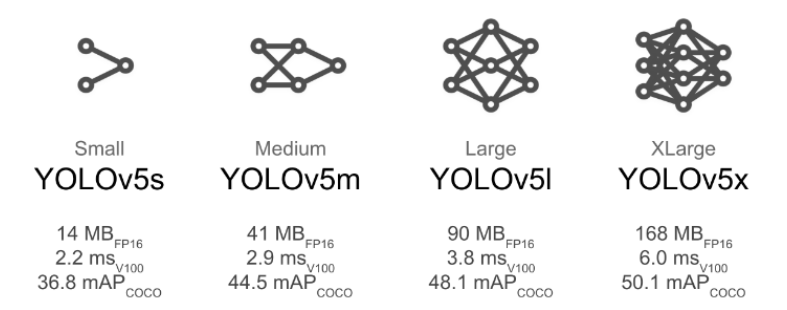

## [1] train.py  -- cfg yolov5m.yaml    

In [10]:
!python train.py --img 416 --batch 16 --epochs 20 --data /content/drive/MyDrive/Ladder_08/Ladder_Working/data.yaml --cfg /content/drive/MyDrive/Ladder_08/yolov5/models/yolov5x.yaml --weights yolov5x.pt  --cache  --name yolov5x

wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5x.pt, cfg=/content/drive/MyDrive/Ladder_08/yolov5/models/yolov5x.yaml, data=/content/drive/MyDrive/Ladder_08/Ladder_Working/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=20, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=yolov5x, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1, freeze=0, patience=100
github: Command 'git fetch && git config --get remote.origin.url' timed out after 5 seconds
YOLOv5 🚀 v5.0-453-g8ad9e4e torch 1.9.0+cu102

In [11]:
# yolov5m.yaml
# detect.py
# /train/images/

!python detect.py  --img 416 --conf 0.25  --source /content/drive/MyDrive/Ladder_08/Ladder_Working/train/images/  --weights '/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/weights/best.pt'  --name yolov5x_train


detect: weights=['/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/weights/best.pt'], source=/content/drive/MyDrive/Ladder_08/Ladder_Working/train/images/, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=yolov5x_train, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False
YOLOv5 🚀 v5.0-453-g8ad9e4e torch 1.9.0+cu102 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
Model Summary: 476 layers, 87225610 parameters, 0 gradients, 217.2 GFLOPs
image 1/729 /content/drive/.shortcut-targets-by-id/1mSmLhyKGkdKwGUCfKmdVZ0sjv3ti2KET/Ladder_08/Ladder_Working/train/images/-c001_jpg.rf.f561255824384df257b87fda5dab1ceb.jpg: 416x416 1 Ladder_without_Outriggers, Done. (0.144s)
image 2/729 /content/drive/.shortcut-targets-by-id/1mSmLhyKGkdKwGUCfKmdVZ0sjv3ti2

In [12]:
# yolov5m.yaml
# detect.py
# /valid/images/


!python detect.py  --img 416 --conf 0.25  --source /content/drive/MyDrive/Ladder_08/Ladder_Working/valid/images/  --weights '/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/weights/best.pt'   --name yolov5x_valid


detect: weights=['/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/weights/best.pt'], source=/content/drive/MyDrive/Ladder_08/Ladder_Working/valid/images/, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=yolov5x_valid, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False
YOLOv5 🚀 v5.0-453-g8ad9e4e torch 1.9.0+cu102 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
Model Summary: 476 layers, 87225610 parameters, 0 gradients, 217.2 GFLOPs
image 1/144 /content/drive/.shortcut-targets-by-id/1mSmLhyKGkdKwGUCfKmdVZ0sjv3ti2KET/Ladder_08/Ladder_Working/valid/images/-c002_jpg.rf.d709e68a129696f49e5aca3c10f2dd84.jpg: 416x416 1 Ladder_without_Outriggers, Done. (0.142s)
image 2/144 /content/drive/.shortcut-targets-by-id/1mSmLhyKGkdKwGUCfKmdVZ0sjv3ti2

In [13]:
# yolov5m.yaml
# detect.py
# /test/images/


!python detect.py  --img 416 --conf 0.25  --source /content/drive/MyDrive/Ladder_08/Ladder_Working/test/images/  --weights '/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/weights/best.pt'   --name yolov5x_test


detect: weights=['/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/weights/best.pt'], source=/content/drive/MyDrive/Ladder_08/Ladder_Working/test/images/, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=yolov5x_test, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False
YOLOv5 🚀 v5.0-453-g8ad9e4e torch 1.9.0+cu102 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
Model Summary: 476 layers, 87225610 parameters, 0 gradients, 217.2 GFLOPs
image 1/99 /content/drive/.shortcut-targets-by-id/1mSmLhyKGkdKwGUCfKmdVZ0sjv3ti2KET/Ladder_08/Ladder_Working/test/images/-c003_jpg.rf.0bd9afa7445abce5e3df6e90f379d412.jpg: 416x416 1 Ladder_without_Outriggers, Done. (0.114s)
image 2/99 /content/drive/.shortcut-targets-by-id/1mSmLhyKGkdKwGUCfKmdVZ0sjv3ti2KET/L

In [14]:

%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## val_batch_pred.jpg

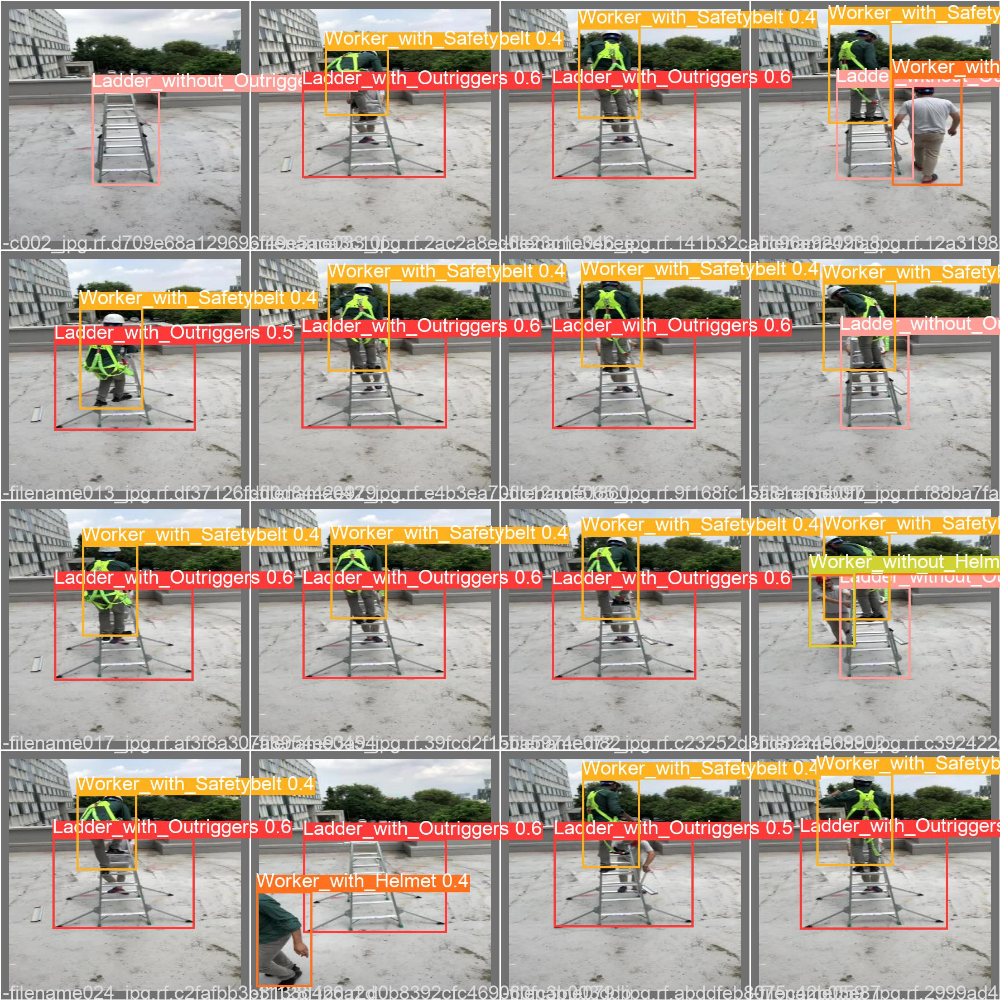

In [15]:
# val_batch0_pred.jpg

import torch
from IPython.display import Image

Image(filename='/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/val_batch0_pred.jpg', width=1000)

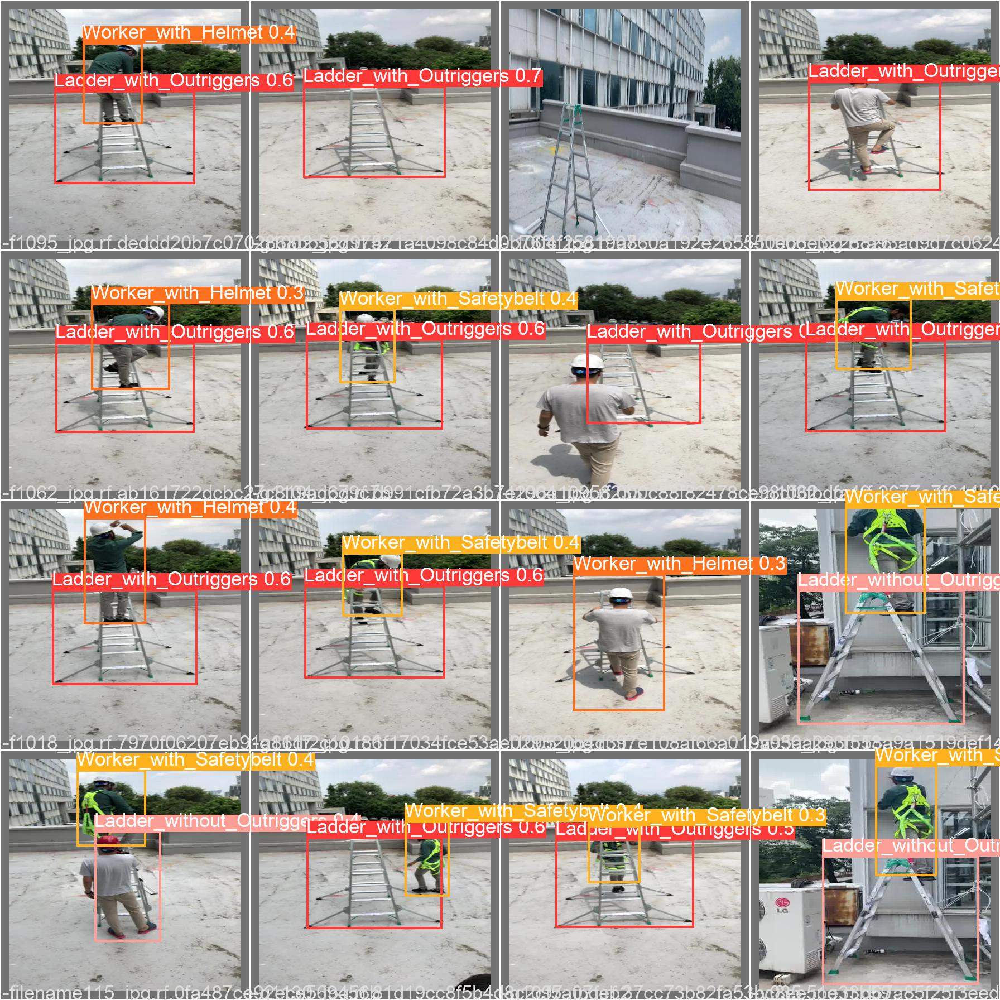

In [16]:
# val_batch1_pred.jpg

import torch
from IPython.display import Image

Image(filename='/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/val_batch1_pred.jpg', width=1000)

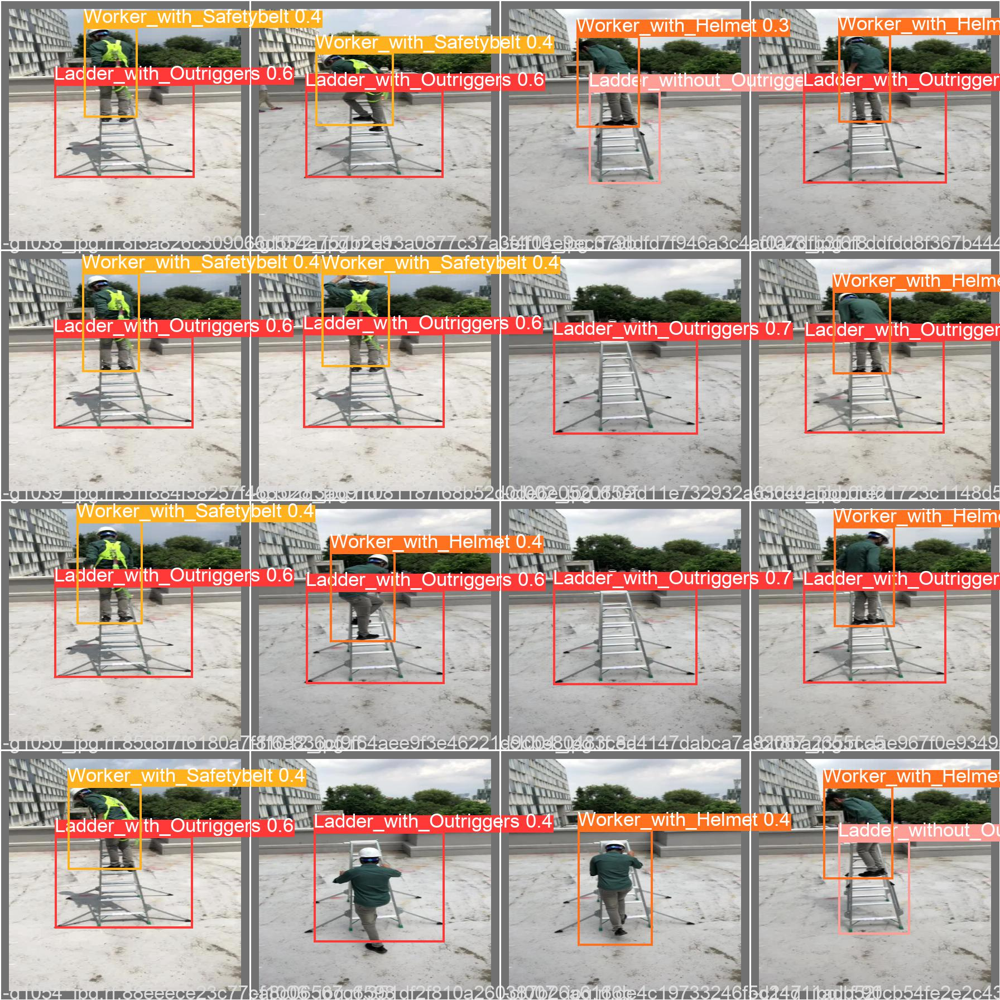

In [17]:
# val_batch3_pred.jpg

import torch
from IPython.display import Image

Image(filename='/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/val_batch2_pred.jpg', width=1000)

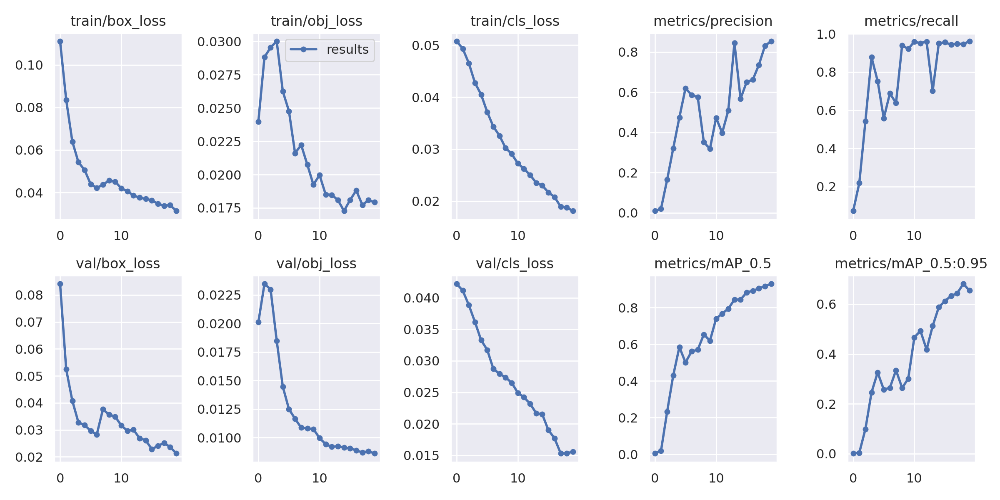

In [18]:
# results.png

import torch
from IPython.display import Image

Image(filename='/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/results.png', width=1000)

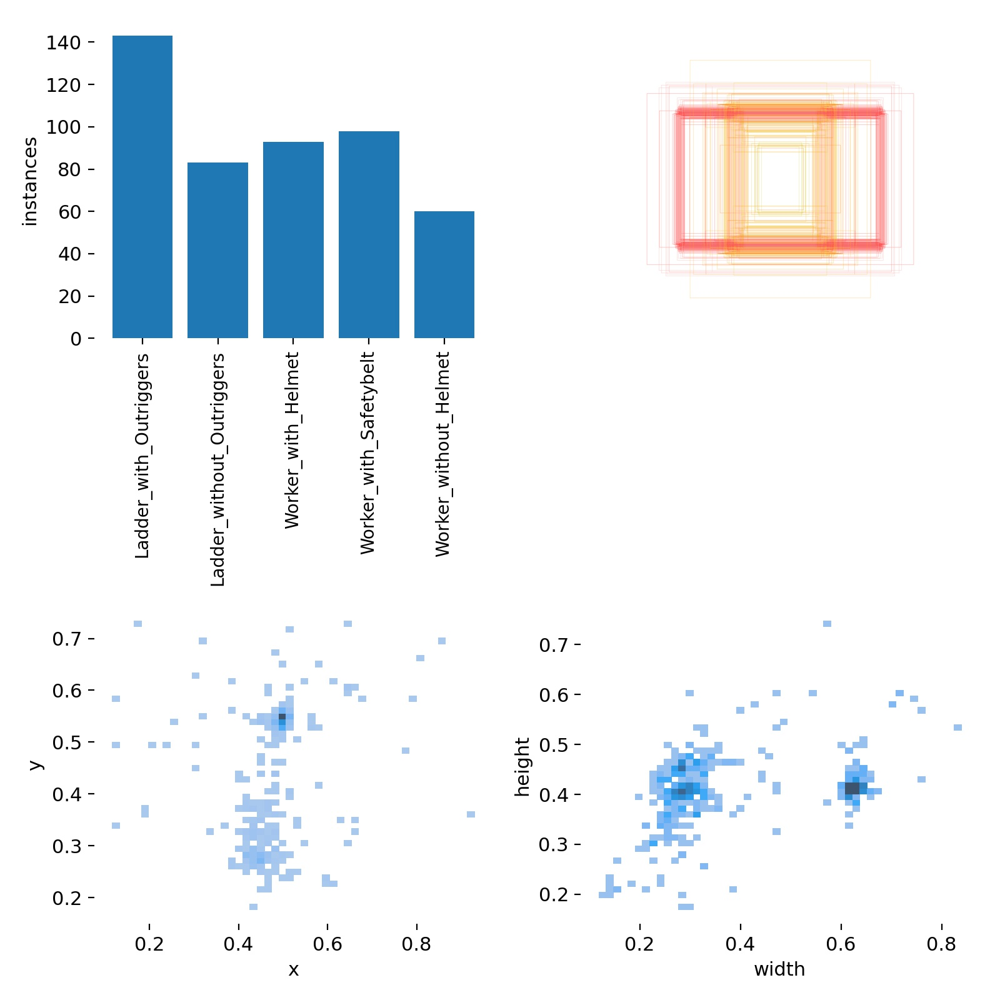

In [19]:
# results.png

import torch
from IPython.display import Image

Image(filename='/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/labels.jpg', width=1000)

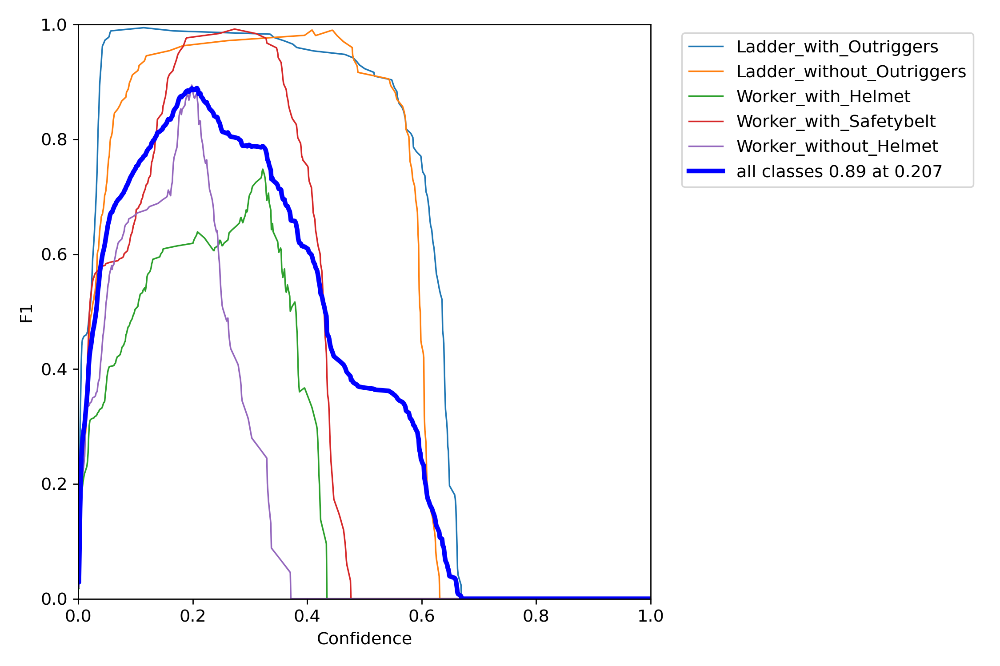

In [20]:
# results.png

import torch
from IPython.display import Image

Image(filename='/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/F1_curve.png', width=1000)

## test.py 

In [21]:
!python val.py --img 416 --batch 16  --data '/home/joo/jw_detection/Ladder_Working_Dataset/data.yaml'  --weights '/home/joo/jw_detection/runs/train/yolov5x/weights/best.pt'    --name yolov5x  --task 'test'  

Traceback (most recent call last):
  File "/usr/lib/python3.7/posixpath.py", line 181, in lexists
    os.lstat(path)
FileNotFoundError: [Errno 2] No such file or directory: './wandb/run-20210922_144849-2algtadn/files/media/metadata/boxes2D/Bounding Box Debugger/home'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "val.py", line 357, in <module>
    opt = parse_opt()
  File "val.py", line 323, in parse_opt
    opt.data = check_yaml(opt.data)  # check YAML
  File "/content/drive/.shortcut-targets-by-id/1mSmLhyKGkdKwGUCfKmdVZ0sjv3ti2KET/Ladder_08/yolov5/utils/general.py", line 300, in check_yaml
    return check_file(file, suffix)
  File "/content/drive/.shortcut-targets-by-id/1mSmLhyKGkdKwGUCfKmdVZ0sjv3ti2KET/Ladder_08/yolov5/utils/general.py", line 317, in check_file
    files = glob.glob('./**/' + file, recursive=True)  # find file
  File "/usr/lib/python3.7/glob.py", line 20, in glob
    return list(iglob(pathname, recur

In [22]:
!python val.py --img 416 --batch 16  --data '/content/drive/MyDrive/Ladder_08/Ladder_Working/data.yaml'  --weights '/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/weights/best.pt'    --name yolov5x  --task 'test'

val: data=/content/drive/MyDrive/Ladder_08/Ladder_Working/data.yaml, weights=['/content/drive/MyDrive/Ladder_08/yolov5/runs/train/yolov5x/weights/best.pt'], batch_size=16, imgsz=416, conf_thres=0.001, iou_thres=0.6, task=test, device=, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=yolov5x, exist_ok=False, half=False
YOLOv5 🚀 v5.0-453-g8ad9e4e torch 1.9.0+cu102 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
Model Summary: 476 layers, 87225610 parameters, 0 gradients, 217.2 GFLOPs
test: Scanning '/content/drive/MyDrive/Ladder_08/Ladder_Working/test.cache' images and labels... 99 found, 0 missing, 0 empty, 0 corrupted: 100% 99/99 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 7/7 [00:12<00:00,  1.80s/it]
                 all         99        196      0.847      0.969      0.894      0.675
Ladder_with_Outriggers         99       

## test_batch_pred.jpg

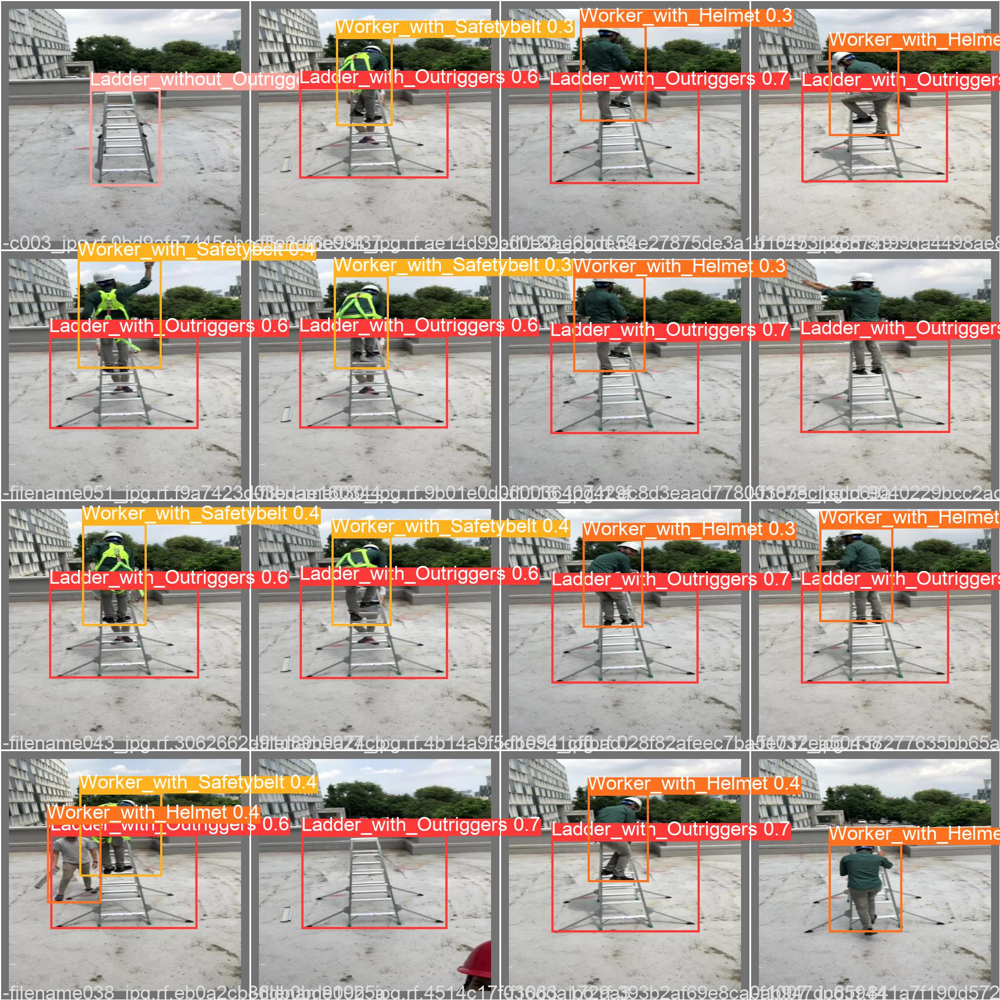

In [25]:
# results.png

import torch
from IPython.display import Image

Image(filename='/content/drive/MyDrive/Ladder_08/yolov5/runs/val/yolov5x/val_batch0_pred.jpg', width=1000)


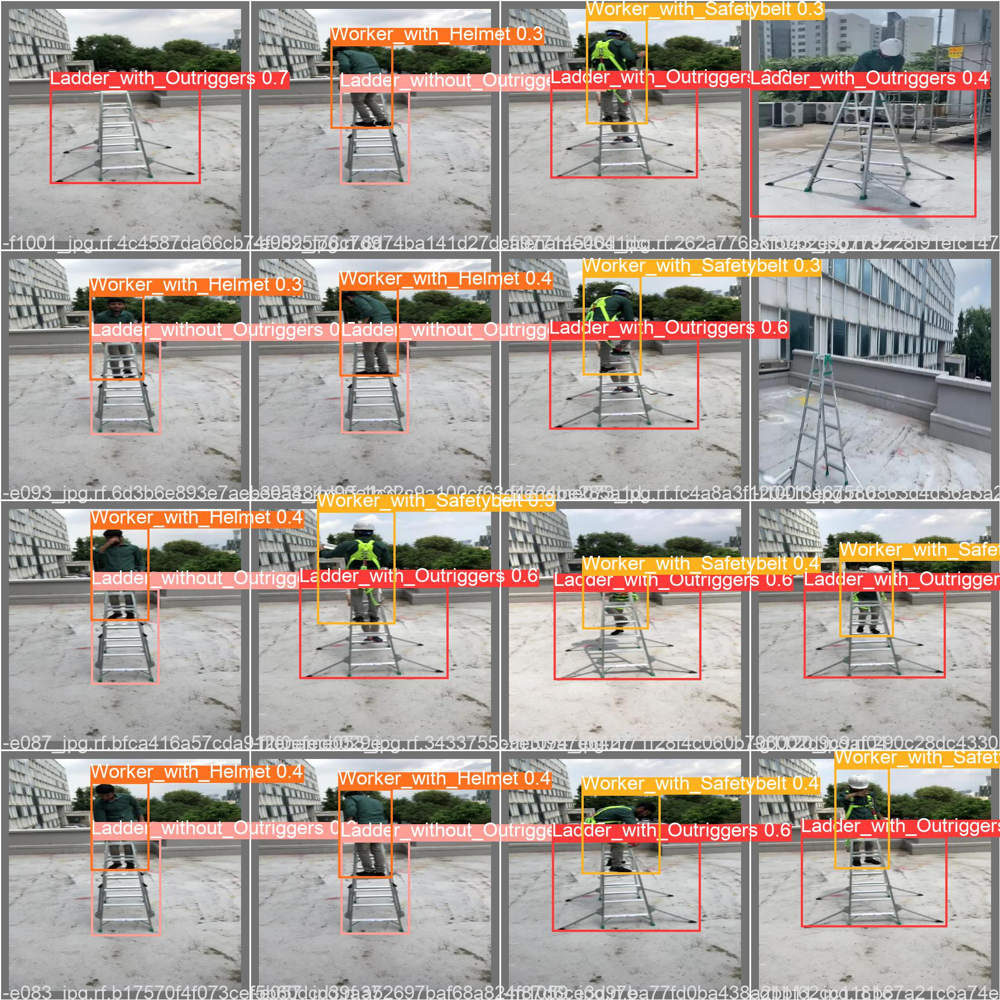

In [26]:
# results.png

import torch
from IPython.display import Image

Image(filename='/content/drive/MyDrive/Ladder_08/yolov5/runs/val/yolov5x/val_batch1_pred.jpg', width=1000)

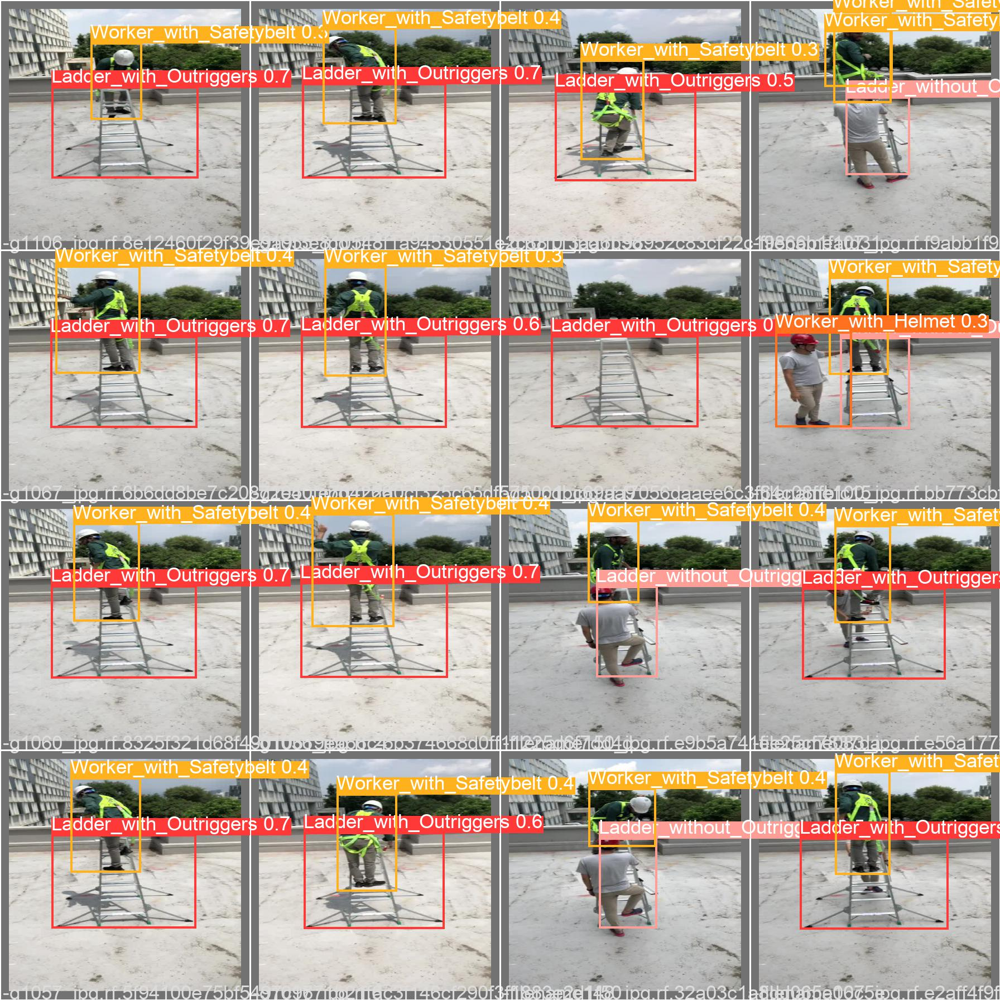

In [27]:
# results.png

import torch
from IPython.display import Image

Image(filename='/content/drive/MyDrive/Ladder_08/yolov5/runs/val/yolov5x/val_batch2_pred.jpg', width=1000)

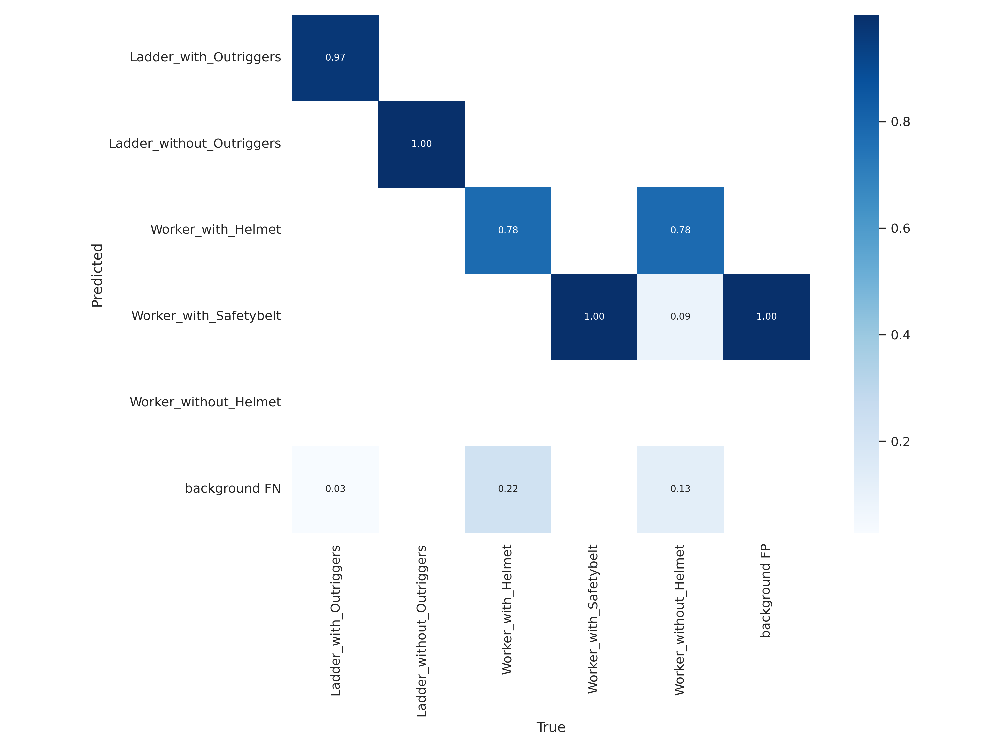

In [28]:
import torch
from IPython.display import Image

Image(filename='/content/drive/MyDrive/Ladder_08/yolov5/runs/val/yolov5x/confusion_matrix.png', width=1000)

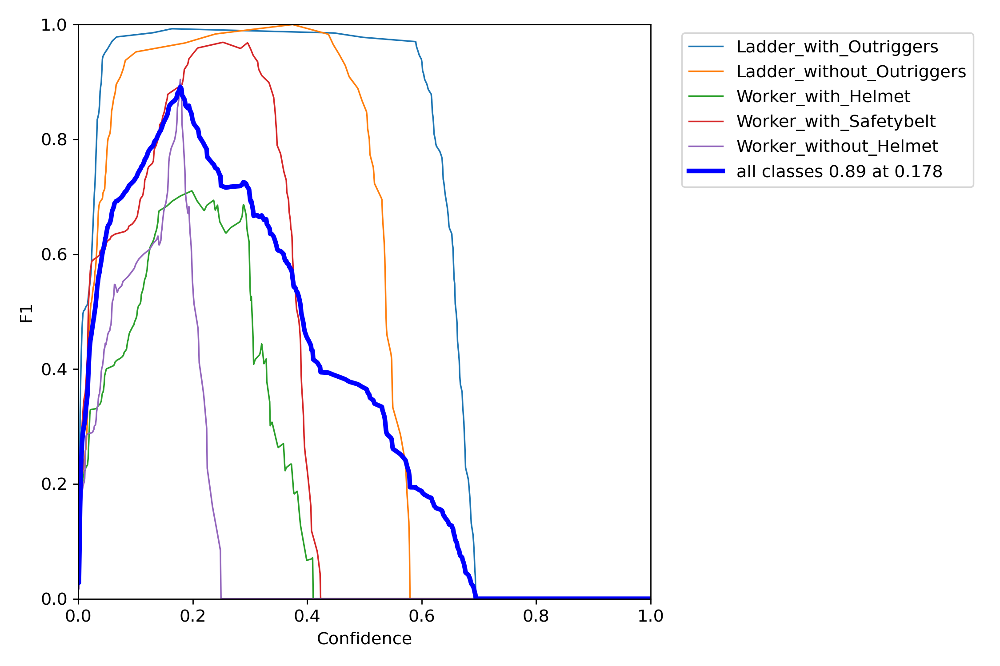

In [29]:
import torch
from IPython.display import Image

Image(filename='/content/drive/MyDrive/Ladder_08/yolov5/runs/val/yolov5x/F1_curve.png', width=1000)